In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='0'

from fastai import *
from fastai.vision import *
from superRes.generators import *
from superRes.critics import *
from superRes.dataset import *
from superRes.loss import *
from superRes.save import *
from superRes.fid_loss import *
from superRes.ssim import *
from superRes.metrics import *

import torchvision
import geffnet # efficient/ mobile net
import perceptual_similarity as lpips

In [2]:
def do_fit(learn, epochs,save_name, lrs=slice(1e-3), pct_start=0.9):
    learn.fit_one_cycle(epochs, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=20)

In [3]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'

path_lowRes_256 = path/'DIV2K_train_LR_256_QF20'
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
path_lowRes_Full = path/'DIV2K_train_LR_Full_QF20'

proj_id = 'unet_superRes_mobilenetV3_MSE'

gen_name = proj_id + '_gen'
crit_name = proj_id + '_crit'

nf_factor = 2
pct_start = 1e-8

In [4]:
model = geffnet.mobilenetv3_rw

In [5]:
class lpips_loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = lpips.PerceptualLoss(model='net-lin', net='vgg', use_gpu=True)
        self.base_loss = F.l1_loss

    def forward(self, input, target):
        self.losses = self.model.forward(input, target)
#         self.losses += F.l1_loss(input, target)
        return self.losses.sum()

In [6]:
# loss_func = FeatureLoss()
# loss_func = msssim
# loss_func = fid
# loss_func = F.mse_loss
loss_func = lpips_loss()

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/vgg.pth
...[net-lin [vgg]] initialized
...Done


# 256px

In [7]:
bs=10
sz=256
lr = 1e-2
wd = 1e-3
epochs = 1

In [8]:
data_gen = get_DIV2k_data_QF(path_lowRes_256, path_fullRes, bs=8, sz=sz)

In [9]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=nf_factor)

In [10]:
learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
# learn_gen.metrics.append(LPIPS_Metric_gen())
# learn_gen.metrics.append(LPIPS_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

In [12]:
wandbCallbacks = False

if wandbCallbacks:
    import wandb
    from wandb.fastai import WandbCallback
    config={"batch_size": bs,
            "img_size": (sz, sz),
            "learning_rate": lr,
            "weight_decay": wd,
            "num_epochs": epochs
    }
    wandb.init(project='SuperRes', config=config, id="unet_superRes_mobilenetV3_FID"+ datetime.now().strftime('_%m-%d_%H:%M'))

    learn_gen.callback_fns.append(partial(WandbCallback, input_type='images'))

In [13]:
# learn_gen.lr_find()
# learn_gen.recorder.plot()
# learn_gen.summary()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,time
0,2.998613,2.654493,0.631828,0.678617,01:34


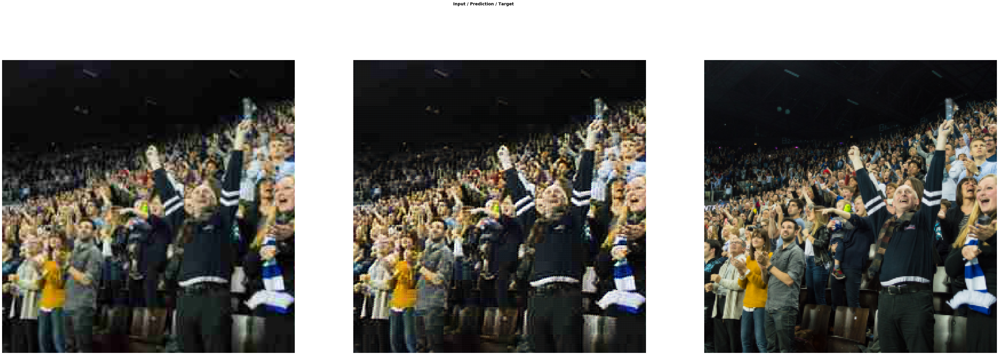

In [15]:
do_fit(learn_gen, 1, gen_name+"_256px_0", slice(lr*10))

In [16]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,time
0,2.927770,2.349425,0.655454,0.678617,01:36
1,2.819466,3.142016,0.594963,0.678617,01:37
2,2.814103,2.408295,0.654461,0.678617,01:35
3,2.838388,2.375533,0.652698,0.678617,01:37
4,2.760209,2.273983,0.668598,0.678617,01:36


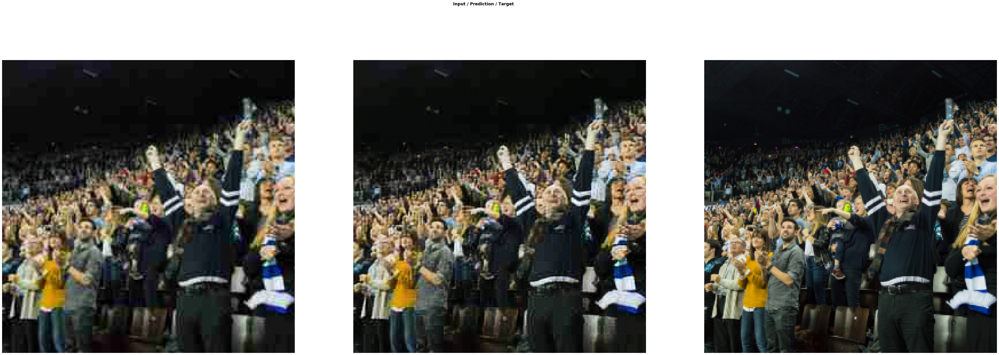

In [17]:
do_fit(learn_gen, 5, gen_name+"_256px_1", lr)

# 512px

In [18]:
bs=4
sz=512
epochs = 1

In [19]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [20]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

13131

In [ ]:
learn_gen.load(gen_name+"_256px_1")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


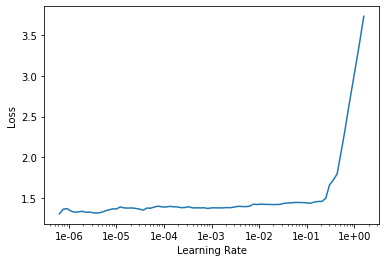

In [21]:
learn_gen.lr_find()
learn_gen.recorder.plot()

Upsize to gen_512


epoch,train_loss,valid_loss,ssim_gen,ssim_in,time
0,1.369792,1.099550,0.690501,0.678617,10:24
1,1.366398,1.091322,0.689119,0.678617,10:29
2,1.344412,1.088007,0.689772,0.678617,10:29


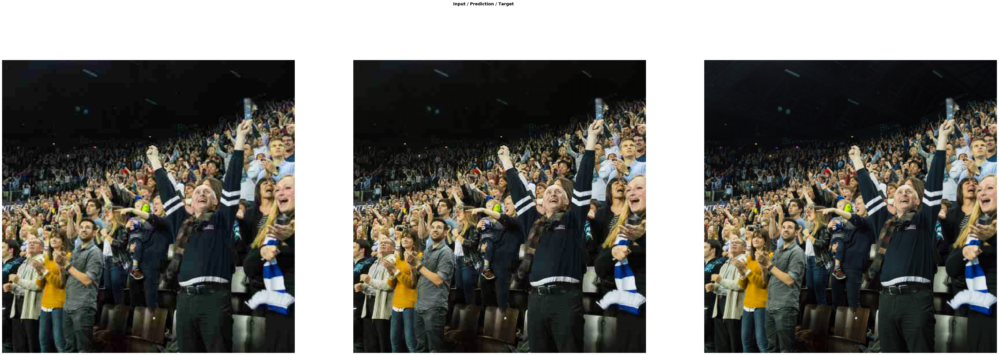

In [22]:
print("Upsize to gen_512")

do_fit(learn_gen, 3, gen_name+"_512px_0", slice(1e-3))

In [23]:
learn_gen.unfreeze()

In [ ]:
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,time
0,1.352842,1.076951,0.691767,0.678617,10:34
1,1.370679,1.097610,0.685389,0.678617,10:32
2,1.364364,1.055665,0.697357,0.678617,10:32


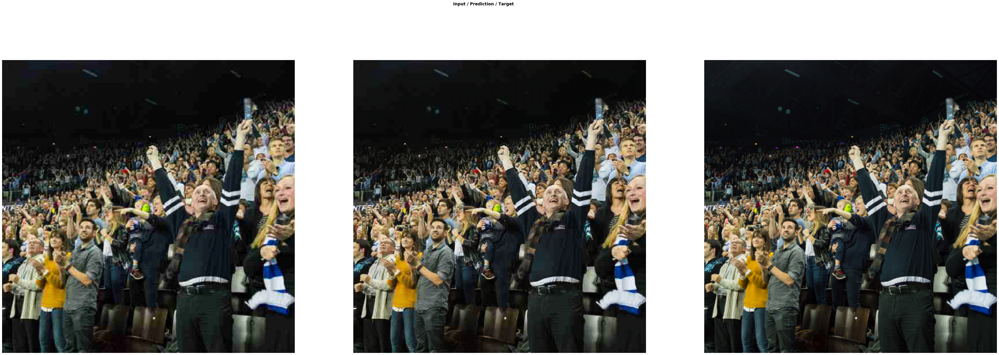

In [24]:
do_fit(learn_gen, 3, gen_name+"_512px_1", 1e-3)

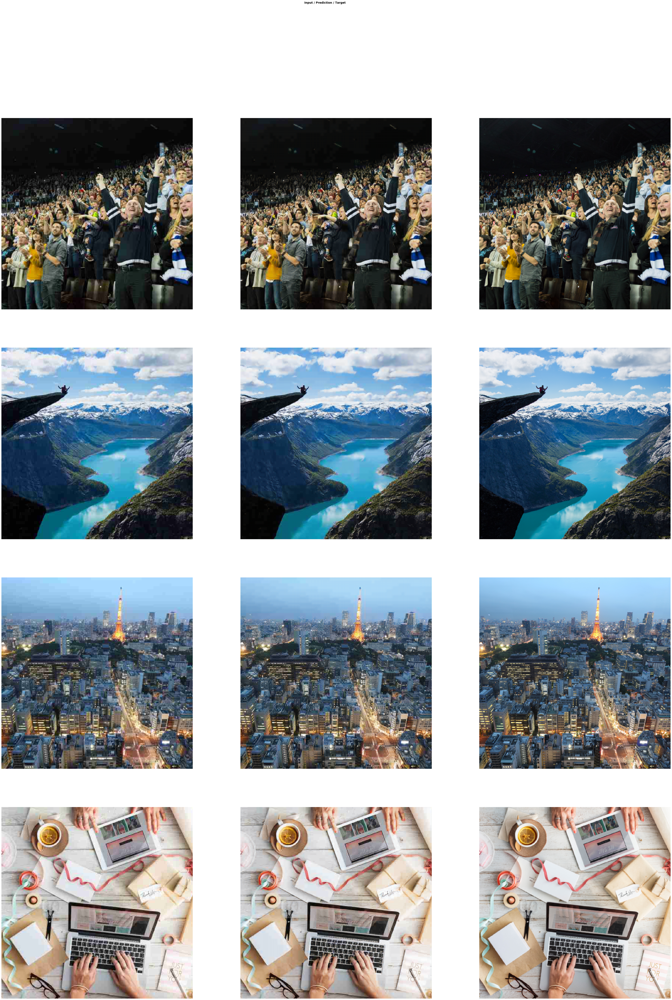

In [25]:
learn_gen.show_results(rows=10, imgsize=20)

In [ ]:
learn_gen = None
gc.collect()

In [11]:
bs=2
sz=512
epochs = 1

path_lowRes_512 = path/'DIV2K_train_LR_512_QF35'

In [12]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [13]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

42

epoch,train_loss,valid_loss,ssim_gen,ssim_in,time
0,1.070040,0.853694,0.749633,0.678617,10:21
1,1.095075,0.856191,0.748128,0.678617,10:28
2,1.066119,0.857069,0.748442,0.678617,10:28


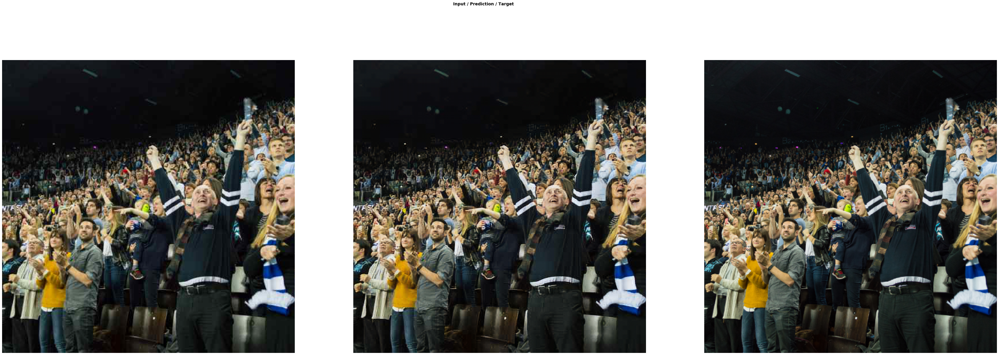

In [29]:
do_fit(learn_gen, 3, gen_name+"_512px_2", 1e-3)

In [14]:
learn_gen.load(gen_name+"_512px_2")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF35;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512_QF35;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
 

In [15]:
learn_gen.unfreeze()

In [ ]:
do_fit(learn_gen, 3, gen_name+"_512px_3", slice(1e-3))

epoch,train_loss,valid_loss,ssim_gen,ssim_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
